In [1]:
#Loading necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import re
import numpy as np

In [2]:
#Loading the dataset
df = pd.read_excel('Bird Strikes_Final.xlsx')

In [7]:
pd.set_option('display.max_columns',None)

In [28]:
df.head(3)

,Record ID,Aircraft: Type,Airport: Name,Altitude bin,Aircraft: Make/Model,Wildlife: Number Struck Actual,Effect: Impact to flight,FlightDate,Effect: Indicated Damage,Aircraft: Number of engines?,Aircraft: Airline/Operator,Origin State,When: Phase of flight,Conditions: Precipitation,Remains of wildlife collected?,Remains of wildlife sent to Smithsonian,Wildlife: Size,Conditions: Sky,Wildlife: Species,Pilot warned of birds or wildlife?,Cost: Total $,Feet above ground,Number of people injured,Is Aircraft Large?,Year,Month
0,202152,Airplane,LAGUARDIA NY,> 1000 ft,B-737-400,859,Engine Shut Down,2000-11-23,Caused damage,2,US AIRWAYS*,New York,Climb,None,False,False,Medium,No Cloud,Unknown bird - medium,N,30736,1500.0,0,Yes,2000,11
1,208159,Airplane,DALLAS/FORT WORTH INTL ARPT,< 1000 ft,MD-80,424,None,2001-07-25,Caused damage,2,AMERICAN AIRLINES,Texas,Landing Roll,None,False,False,Small,Some Cloud,Rock pigeon,Y,0,0.0,0,No,2001,7
2,207601,Airplane,LAKEFRONT AIRPORT,< 1000 ft,C-500,261,None,2001-09-14,No damage,2,BUSINESS,Louisiana,Approach,None,False,False,Small,No Cloud,European starling,N,0,50.0,0,No,2001,9


In [13]:
# df.drop('Remarks',axis = 1,inplace = True)
df.drop('Wildlife: Number struck',axis = 1,inplace = True)

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24747 entries, 0 to 25557
Data columns (total 26 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   Record ID                                24747 non-null  int64         
 1   Aircraft: Type                           24747 non-null  object        
 2   Airport: Name                            24747 non-null  object        
 3   Altitude bin                             24747 non-null  object        
 4   Aircraft: Make/Model                     24747 non-null  object        
 5   Wildlife: Number Struck Actual           24747 non-null  int64         
 6   Effect: Impact to flight                 24747 non-null  object        
 7   FlightDate                               24747 non-null  datetime64[ns]
 8   Effect: Indicated Damage                 24747 non-null  object        
 9   Aircraft: Number of engines?           

In [23]:
df.isna().sum()

Record ID                                    0
Aircraft: Type                             129
Airport: Name                              129
Altitude bin                               129
Aircraft: Make/Model                         0
Wildlife: Number Struck Actual               0
Effect: Impact to flight                   129
FlightDate                                 129
Effect: Indicated Damage                     0
Aircraft: Number of engines?               267
Aircraft: Airline/Operator                 129
Origin State                               449
When: Phase of flight                      129
Conditions: Precipitation                    0
Remains of wildlife collected?               0
Remains of wildlife sent to Smithsonian      0
Wildlife: Size                             129
Conditions: Sky                              0
Wildlife: Species                            0
Pilot warned of birds or wildlife?         129
Cost: Total $                                0
Feet above gr

In [88]:
df.shape

(24746, 26)

In [89]:
#Summary Statistics of the dataset
df.describe()

,ID,No_Widelife_Strck,Cost of Damage,Feet above ground,No_People Injured,Year,Month
count,24746.000000,24746.000000,2.474600e+04,24746.000000,24746.000000,24746.000000,24746.000000
mean,254487.694496,2.689324,5.485378e+03,801.409197,0.000849,2006.503960,7.217207
std,35581.348233,12.506269,1.231464e+05,1736.659332,0.047987,3.353336,2.792910
min,200011.000000,1.000000,0.000000e+00,0.000000,0.000000,2000.000000,1.000000
25%,225829.250000,1.000000,0.000000e+00,0.000000,0.000000,2004.000000,5.000000
50%,248553.500000,1.000000,0.000000e+00,50.000000,0.000000,2007.000000,8.000000
75%,268974.750000,1.000000,0.000000e+00,700.000000,0.000000,2009.000000,9.000000
max,321909.000000,942.000000,1.239775e+07,18000.000000,6.000000,2011.000000,12.000000


In [90]:
#Correlation matrix
df.corr()

,ID,No_Widelife_Strck,Remains of wildlife collected?,Remains sent to Smithsonian,Cost of Damage,Feet above ground,No_People Injured,Year,Month
ID,1.000000,-0.025170,0.293183,0.178503,-0.012484,-0.018144,-0.009155,0.938153,0.062554
No_Widelife_Strck,-0.025170,1.000000,0.040498,0.013799,0.042276,-0.035138,0.011954,-0.032401,0.009020
Remains of wildlife collected?,0.293183,0.040498,1.000000,0.473367,0.027375,-0.161664,0.000646,0.301593,0.012733
Remains sent to Smithsonian,0.178503,0.013799,0.473367,1.000000,0.053161,0.002739,0.001250,0.169637,0.018570
Cost of Damage,-0.012484,0.042276,0.027375,0.053161,1.000000,-0.001343,0.208269,-0.013556,-0.015696
Feet above ground,-0.018144,-0.035138,-0.161664,0.002739,-0.001343,1.000000,0.000883,-0.015845,0.030351
No_People Injured,-0.009155,0.011954,0.000646,0.001250,0.208269,0.000883,1.000000,-0.010694,-0.004089
Year,0.938153,-0.032401,0.301593,0.169637,-0.013556,-0.015845,-0.010694,1.000000,0.005162
Month,0.062554,0.009020,0.012733,0.018570,-0.015696,0.030351,-0.004089,0.005162,1.000000


<AxesSubplot:>

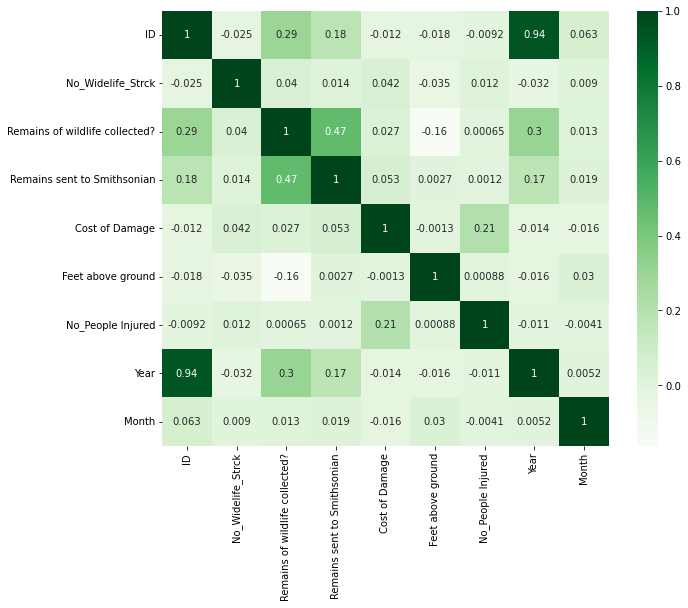

In [271]:
#Correlation plot
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(), annot = True, cmap = 'Greens')

In [93]:
#130 rows of NaN dropped off as that number cannot affect the quality of the analysis output.
df.dropna(inplace = True)

In [19]:
#Extracting and creating Month and Year columns from Flight Date
df['Year'] = df['FlightDate'].apply(lambda x: x.year)
df['Month'] = df['FlightDate'].apply(lambda x: x.month)

In [26]:
#Changing from float data type to int32
df['Year'] = df['Year'].astype(int)
df['Month'] = df['Month'].astype(int)

In [30]:
#Listing the columns
df.columns

Index(['Record ID', 'Aircraft: Type', 'Airport: Name', 'Altitude bin',
       'Aircraft: Make/Model', 'Wildlife: Number Struck Actual',
       'Effect: Impact to flight', 'FlightDate', 'Effect: Indicated Damage',
       'Aircraft: Number of engines?', 'Aircraft: Airline/Operator',
       'Origin State', 'When: Phase of flight', 'Conditions: Precipitation',
       'Remains of wildlife collected?',
       'Remains of wildlife sent to Smithsonian', 'Wildlife: Size',
       'Conditions: Sky', 'Wildlife: Species',
       'Pilot warned of birds or wildlife?', 'Cost: Total $',
       'Feet above ground', 'Number of people injured', 'Is Aircraft Large?',
       'Year', 'Month'],
      dtype='object')

In [33]:
#Renaming columns
df.rename(columns = {'Record ID':'ID', 'Aircraft: Type':'Type', 'Airport: Name':'Airport_Name', 'Altitude bin':'Altitude_Bin',
       'Aircraft: Make/Model':'Make/Model', 'Wildlife: Number Struck Actual':'No_Widelife_Strck',
       'Effect: Impact to flight':'Impact to flight', 'FlightDate':'FlightDate', 'Effect: Indicated Damage':'Indicated Damage',
       'Aircraft: Number of engines?':'No_Engines', 'Aircraft: Airline/Operator':'Airline/Operator',
       'Origin State':'State', 'When: Phase of flight':'Flight Phase', 'Conditions: Precipitation':'Precipitation',
       'Remains of wildlife collected?':'Remains of wildlife collected?',
       'Remains of wildlife sent to Smithsonian':'Remains sent to Smithsonian', 'Wildlife: Size':'Widelife Size',
       'Conditions: Sky':'Sky_Condition', 'Wildlife: Species':'Species',
       'Pilot warned of birds or wildlife?':'Pilot Warned?', 'Cost: Total $':'Cost of Damage',
       'Feet above ground':'Feet above ground', 'Number of people injured':'No_People Injured', 'Is Aircraft Large?':'Is Aircraft Large',
       'Year':'Year', 'Month':'Month'},inplace = True)

In [94]:
#Viewig the first two rows of the dataframe
df.head(2)

,ID,Type,Airport_Name,Altitude_Bin,Make/Model,No_Widelife_Strck,Impact to flight,FlightDate,Indicated Damage,No_Engines,Airline/Operator,State,Flight Phase,Precipitation,Remains of wildlife collected?,Remains sent to Smithsonian,Widelife Size,Sky_Condition,Species,Pilot Warned?,Cost of Damage,Feet above ground,No_People Injured,Is Aircraft Large,Year,Month
0,202152,Airplane,LAGUARDIA NY,> 1000 ft,B-737-400,859,Engine Shut Down,2000-11-23,Caused damage,2,US AIRWAYS*,New York,Climb,None,False,False,Medium,No Cloud,Unknown bird - medium,N,30736,1500.0,0,Yes,2000,11
1,208159,Airplane,DALLAS/FORT WORTH INTL ARPT,< 1000 ft,MD-80,424,None,2001-07-25,Caused damage,2,AMERICAN AIRLINES,Texas,Landing Roll,None,False,False,Small,Some Cloud,Rock pigeon,Y,0,0.0,0,No,2001,7


In [95]:
#Count of the Airplane type columns
df['Type'].value_counts()

Airplane    24746
Name: Type, dtype: int64

In [207]:
# Count of the Airport Name
df['Airport_Name'].value_counts()[:20]

DALLAS/FORT WORTH INTL ARPT               802
SACRAMENTO INTL                           676
SALT LAKE CITY INTL                       479
DENVER INTL AIRPORT                       476
KANSAS CITY INTL                          452
PHILADELPHIA INTL                         442
ORLANDO INTL                              408
BALTIMORE WASH INTL                       401
LOUISVILLE INTL ARPT                      394
JOHN F KENNEDY INTL                       389
CHARLOTTE/DOUGLAS INTL ARPT               367
NASHVILLE INTL                            364
LAMBERT-ST LOUIS INTL                     363
CHICAGO O'HARE INTL ARPT                  331
PORTLAND INTL (OR)                        313
NEWARK LIBERTY INTL ARPT                  305
CINCINNATI/NORTHERN KENTUCKY INTL ARPT    302
ATLANTA INTL                              296
CHICAGO MIDWAY INTL ARPT                  295
HOUSTON-HOBBY                             293
Name: Airport_Name, dtype: int64

In [97]:
df['Airport_Name'].nunique()

976

In [98]:
df['Altitude_Bin'].value_counts()

< 1000 ft    19977
> 1000 ft     4769
Name: Altitude_Bin, dtype: int64

<AxesSubplot:xlabel='Altitude_Bin', ylabel='count'>

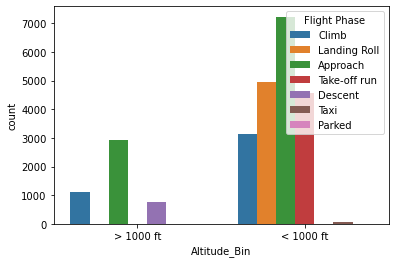

In [240]:
sns.countplot(x="Altitude_Bin", hue="Flight Phase", data=df)

In [184]:
df['Altitude_Bin'].value_counts(normalize = True)

< 1000 ft    0.807282
> 1000 ft    0.192718
Name: Altitude_Bin, dtype: float64

In [185]:
df['Make/Model'].value_counts(normalize = True)[:10]

B-737-700       0.100461
B-737-300       0.093268
CL-RJ100/200    0.078801
A-320           0.046755
EMB-145         0.039966
A-319           0.039441
B-757-200       0.037218
MD-82           0.025620
B-737-800       0.024368
B-717-200       0.023276
Name: Make/Model, dtype: float64

In [100]:
df['No_Widelife_Strck'].sum()

66550

In [187]:
#Grouping the Altitude Bin
df.groupby('Altitude_Bin').count()['No_Widelife_Strck']

Altitude_Bin
< 1000 ft    19977
> 1000 ft     4769
Name: No_Widelife_Strck, dtype: int64

In [102]:
df.pivot_table(index = 'Altitude_Bin', values = ['No_Widelife_Strck','Cost of Damage'], aggfunc= 'sum')

,Cost of Damage,No_Widelife_Strck
Altitude_Bin,,
< 1000 ft,106245863,58007
> 1000 ft,29495306,8543


In [219]:
import plotly.express as px
fig = px.pie(df, values='Cost of Damage', names='Altitude_Bin',
                 title='Cost of Damage by Altitude Bin',
             hover_data=['Cost of Damage'], labels={'Cost of Damage':'No_Widelife_Strck'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [103]:
df.pivot_table(index = 'Altitude_Bin', values = ['No_Widelife_Strck','Cost of Damage'], aggfunc= 'mean')

,Cost of Damage,No_Widelife_Strck
Altitude_Bin,,
< 1000 ft,5318.409321,2.903689
> 1000 ft,6184.798910,1.791361


In [218]:
import plotly.express as px
fig = px.pie(df, values='No_Widelife_Strck', names='Altitude_Bin',
             title='Number of widelife by Altitude',
             hover_data=['Cost of Damage'], labels={'Cost of Damage':'No_Widelife_Strck'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [188]:
df['Impact to flight'].value_counts(normalize = True)

None                     0.919381
Precautionary Landing    0.043078
Aborted Take-off         0.018912
Other                    0.015194
Engine Shut Down         0.003435
Name: Impact to flight, dtype: float64

<AxesSubplot:xlabel='Impact to flight', ylabel='count'>

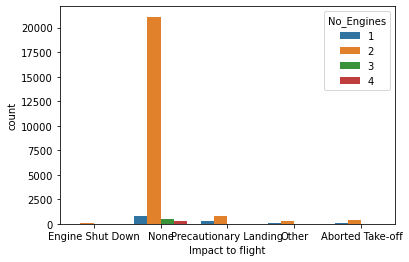

In [242]:
sns.countplot(x="Impact to flight", hue="No_Engines", data=df)

In [106]:
df.pivot_table(index = 'Impact to flight', 
               values = 'Cost of Damage', 
               aggfunc = "sum").sort_values(by = 'Cost of Damage', ascending = False)

,Cost of Damage
Impact to flight,
Precautionary Landing,40918193
None,34243325
Other,25414358
Engine Shut Down,22248496
Aborted Take-off,12916797


In [217]:
fig = px.bar(df, x="Impact to flight", y="Cost of Damage",color='Feet above ground',height=400)
fig.show()

In [189]:
df['Indicated Damage'].value_counts(normalize = True)

No damage        0.903661
Caused damage    0.096339
Name: Indicated Damage, dtype: float64

<AxesSubplot:xlabel='Indicated Damage', ylabel='count'>

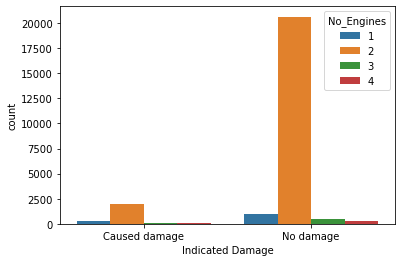

In [243]:
sns.countplot(x="Indicated Damage", hue="No_Engines", data=df)

In [108]:
df.pivot_table(index = 'Year', 
               columns = 'Indicated Damage', 
               values = 'No_Widelife_Strck', 
               aggfunc = 'sum')

Indicated Damage,Caused damage,No damage
Year,,
2000,1799,2635
2001,893,3662
2002,897,4461
2003,1164,4371
2004,700,3619
2005,582,4485
2006,1329,4434
2007,696,4109
2008,758,4524


In [220]:
import plotly.express as px
fig = px.pie(df, values='No_Widelife_Strck', names='Year',
             title='Number of widelife struck by Year',
             hover_data=['Cost of Damage'], labels={'Cost of Damage':'No_Widelife_Strck'})
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [225]:
fig = px.bar(df, x="Year", y="No_Widelife_Strck",color='Flight Phase',height=400)
fig.show()

In [86]:
df.drop(df[df['No_Engines'] == "C"].index, inplace = True)

In [109]:
df['No_Engines'].value_counts()

2    22607
1     1240
3      530
4      369
Name: No_Engines, dtype: int64

<AxesSubplot:xlabel='No_Engines', ylabel='count'>

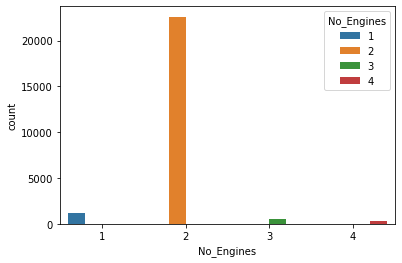

In [244]:
sns.countplot(x="No_Engines", hue="No_Engines", data=df)

In [110]:
df.pivot_table(index = 'No_Engines', 
               values = 'Cost of Damage', 
               aggfunc = "sum").sort_values(by = 'Cost of Damage', ascending = False)

,Cost of Damage
No_Engines,
2,121024164
3,8412578
4,3906667
1,2397760


In [226]:
fig = px.bar(df, x="No_Engines", y="Cost of Damage",color='Flight Phase',height=400)
fig.show()

In [190]:
df['Airline/Operator'].value_counts(normalize = True)[:10]

SOUTHWEST AIRLINES         0.187020
BUSINESS                   0.122606
AMERICAN AIRLINES          0.074840
DELTA AIR LINES            0.053019
AMERICAN EAGLE AIRLINES    0.037178
SKYWEST AIRLINES           0.036006
US AIRWAYS*                0.031520
JETBLUE AIRWAYS            0.027358
UPS AIRLINES               0.022064
US AIRWAYS                 0.020811
Name: Airline/Operator, dtype: float64

In [117]:
df.pivot_table(index = ['Airline/Operator','No_Engines'], 
               values = 'Cost of Damage', 
               aggfunc = "sum").sort_values(by = 'Cost of Damage', ascending = False)[:10]

,,Cost of Damage
Airline/Operator,No_Engines,
BUSINESS,2,48990561
UNITED AIRLINES,2,11809217
UPS AIRLINES,2,7124573
FEDEX EXPRESS,3,6188258
DELTA AIR LINES,2,6152916
HAWAIIAN AIR,2,5736080
THOMSONFLY,2,4570000
ALASKA AIRLINES,2,3367651
FRONTIER AIRLINES,2,3017664


In [227]:
fig = px.bar(df, x="Airline/Operator", y="No_Widelife_Strck",color='Flight Phase',height=400)
fig.show()

In [139]:
df.pivot_table(index = 'State', 
               columns = 'Year', 
               values = 'Cost of Damage', 
               aggfunc = 'sum')[:10].sort_values(by='State', ascending = True)

Year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011
State,,,,,,,,,,,,
Alabama,134.0,12397751.0,88108.0,11731.0,0.0,258310.0,27257.0,1224761.0,0.0,0.0,3285.0,450.0
Alaska,9221.0,0.0,6719.0,29635.0,3608.0,17570.0,228.0,1911.0,762258.0,3879.0,2978999.0,315200.0
Alberta,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
Arizona,100093.0,61435.0,0.0,0.0,86052.0,405096.0,2932.0,111.0,0.0,105.0,72075.0,300.0
Arkansas,2005.0,0.0,169877.0,0.0,0.0,176.0,21677.0,9612.0,82254.0,0.0,123513.0,0.0
British Columbia,0.0,0.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,NaN,0.0,0.0
California,1408932.0,177059.0,143493.0,4933853.0,558129.0,212589.0,6258737.0,2123775.0,1377862.0,753008.0,156869.0,4531963.0
Colorado,19887.0,0.0,11004.0,2223.0,11545.0,0.0,13120.0,2333.0,2309281.0,850159.0,924.0,159119.0
Connecticut,2673.0,0.0,571392.0,37043.0,124.0,5125.0,34568.0,1111.0,0.0,406.0,0.0,8500.0


In [228]:
fig = px.bar(df, x="State", y="Cost of Damage",color='Flight Phase',height=400)
fig.show()

In [191]:
df['Flight Phase'].value_counts(normalize = True)

Approach        0.410208
Landing Roll    0.199871
Take-off run    0.184272
Climb           0.171624
Descent         0.030793
Taxi            0.002869
Parked          0.000364
Name: Flight Phase, dtype: float64

<AxesSubplot:xlabel='Flight Phase', ylabel='count'>

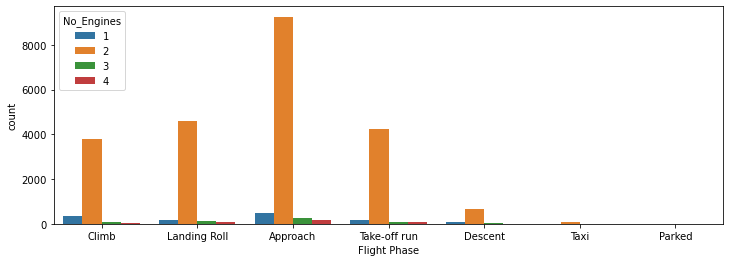

In [252]:
plt.figure(figsize=(12,4))
sns.countplot(x="Flight Phase", hue="No_Engines", data=df)

In [192]:

df['Precipitation'].value_counts(normalize = True)

None               0.920149
Rain               0.053261
Fog                0.019195
Snow               0.003435
Fog, Rain          0.003435
Rain, Snow         0.000242
Fog, Snow          0.000162
Fog, Rain, Snow    0.000121
Name: Precipitation, dtype: float64

<AxesSubplot:xlabel='Precipitation', ylabel='count'>

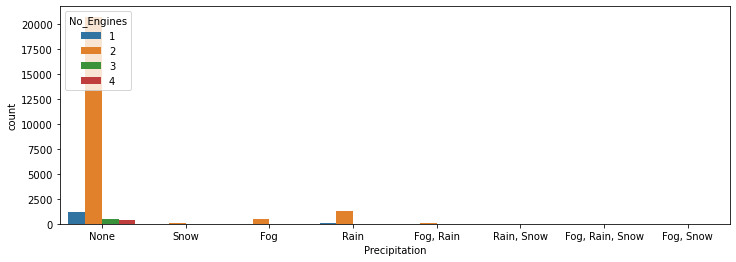

In [253]:
plt.figure(figsize=(12,4))
sns.countplot(x="Precipitation", hue="No_Engines", data=df)

In [145]:
df.pivot_table(index = 'Precipitation', values = 'No_Widelife_Strck', columns = 'Year', aggfunc = 'sum')

Year,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011
Precipitation,,,,,,,,,,,,
Fog,164.0,160.0,177.0,107.0,156.0,162.0,143.0,77.0,179.0,140.0,100.0,170.0
"Fog, Rain",NaN,NaN,46.0,30.0,34.0,85.0,20.0,7.0,20.0,87.0,18.0,4.0
"Fog, Rain, Snow",NaN,NaN,NaN,1.0,NaN,1.0,NaN,4.0,NaN,NaN,NaN,NaN
"Fog, Snow",NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,2.0
None,3900.0,4229.0,4620.0,5050.0,3640.0,4582.0,5091.0,4443.0,4742.0,6212.0,6945.0,6240.0
Rain,255.0,157.0,484.0,277.0,477.0,231.0,493.0,247.0,325.0,539.0,340.0,521.0
"Rain, Snow",NaN,NaN,NaN,1.0,6.0,2.0,1.0,10.0,NaN,NaN,NaN,NaN
Snow,115.0,9.0,31.0,69.0,5.0,4.0,14.0,17.0,16.0,23.0,89.0,2.0


In [193]:
df['Remains of wildlife collected?'].value_counts(normalize = True)

False    0.730502
True     0.269498
Name: Remains of wildlife collected?, dtype: float64

<AxesSubplot:xlabel='Remains of wildlife collected?', ylabel='count'>

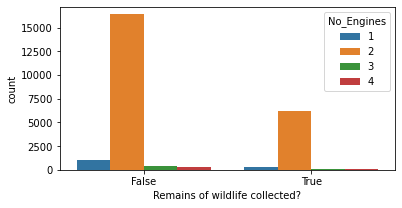

In [254]:
plt.figure(figsize=(6,3))
sns.countplot(x="Remains of wildlife collected?", hue="No_Engines", data=df)

In [194]:
df['Remains sent to Smithsonian'].value_counts(normalize = True)

False    0.923543
True     0.076457
Name: Remains sent to Smithsonian, dtype: float64

<AxesSubplot:xlabel='Remains sent to Smithsonian', ylabel='count'>

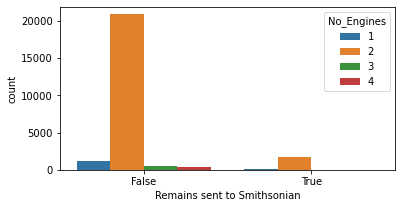

In [255]:
plt.figure(figsize=(6,3))
sns.countplot(x="Remains sent to Smithsonian", hue="No_Engines", data=df)

In [195]:
df['Widelife Size'].value_counts(normalize = True)

Small     0.687020
Medium    0.230987
Large     0.081993
Name: Widelife Size, dtype: float64

<AxesSubplot:xlabel='Widelife Size', ylabel='count'>

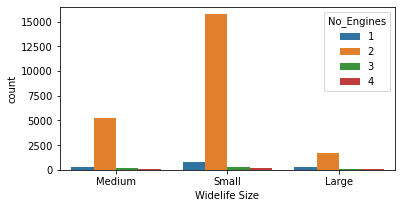

In [256]:
plt.figure(figsize=(6,3))
sns.countplot(x="Widelife Size", hue="No_Engines", data=df)

In [234]:
df['Widelife Size'].value_counts()

Small     17001
Medium     5716
Large      2029
Name: Widelife Size, dtype: int64

In [153]:
df.pivot_table(index = 'Widelife Size', values = 'Cost of Damage', aggfunc = 'sum')

,Cost of Damage
Widelife Size,
Large,79518285
Medium,33102473
Small,23120411


In [231]:
fig = px.bar(df, x="Widelife Size", y="No_Widelife_Strck",color='Flight Phase',height=400)
fig.show()

In [196]:
df['Sky_Condition'].value_counts(normalize = True)

No Cloud      0.493494
Some Cloud    0.339691
Overcast      0.166815
Name: Sky_Condition, dtype: float64

<AxesSubplot:xlabel='Sky_Condition', ylabel='count'>

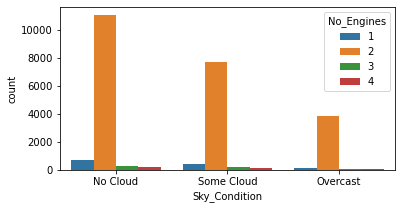

In [257]:
plt.figure(figsize=(6,3))
sns.countplot(x="Sky_Condition", hue="No_Engines", data=df)

In [156]:
df.groupby('Sky_Condition').count()['Cost of Damage']

Sky_Condition
No Cloud      12212
Overcast       4128
Some Cloud     8406
Name: Cost of Damage, dtype: int64

In [162]:
df.groupby("State")

In [164]:
ca = df.groupby("State")

In [165]:
#Fetching the Bird strikes that particularly happened in Carlifonia in the different Sky Conditions
ca['Sky_Condition'].value_counts().loc['California'].sort_values(ascending = False)

Sky_Condition
No Cloud      1567
Some Cloud     531
Overcast       388
Name: Sky_Condition, dtype: int64

In [259]:
df['Species'].value_counts(normalize = True)[:10].sort_values(ascending = False)

Unknown bird - small     0.410006
Unknown bird - medium    0.168027
Mourning dove            0.035763
European starling        0.035278
Unknown bird - large     0.030672
Rock pigeon              0.023519
Barn swallow             0.022711
Killdeer                 0.018468
American kestrel         0.017740
Red-tailed hawk          0.016366
Name: Species, dtype: float64

In [198]:
df['Pilot Warned?'].value_counts(normalize = True)[:10]

N    0.569425
Y    0.430575
Name: Pilot Warned?, dtype: float64

<AxesSubplot:xlabel='Pilot Warned?', ylabel='count'>

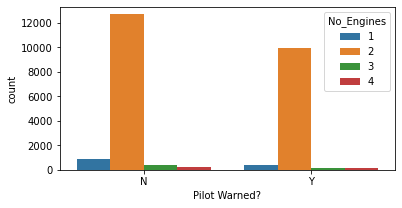

In [261]:
plt.figure(figsize=(6,3))
sns.countplot(x='Pilot Warned?', hue="No_Engines", data=df)

In [199]:
df['Feet above ground'].value_counts(normalize = True)[:10]

0.0      0.387416
100.0    0.053019
50.0     0.049543
200.0    0.039077
500.0    0.034874
10.0     0.034794
Name: Feet above ground, dtype: float64

In [178]:
df.groupby('Year').sum()['No_People Injured'].sort_values(ascending = False)

Year
2003    8
2001    3
2002    3
2008    3
2011    2
2006    1
2009    1
2000    0
2004    0
2005    0
2007    0
2010    0
Name: No_People Injured, dtype: int64

In [235]:
fig = px.bar(df, x="Year", y="No_People Injured",color='Flight Phase',height=400)
fig.show()

In [177]:
df.pivot_table(index = 'Is Aircraft Large', values = ['Cost of Damage', 'No_People Injured'], aggfunc='sum')

,Cost of Damage,No_People Injured
Is Aircraft Large,,
No,90558579,21
Yes,45182590,0


In [180]:
df.pivot_table(index = 'Month', values = ['Cost of Damage', 'No_People Injured'], aggfunc='sum').sort_values(by = 'Cost of Damage', ascending = False)

,Cost of Damage,No_People Injured
Month,,
1,22164416,4
10,20536254,2
11,16518587,6
4,15293417,1
8,11542619,1
6,9156122,3
3,8235062,0
5,8004520,1
7,7771976,0


In [200]:
df['Month'].value_counts(normalize = True)

8     0.146731
9     0.135658
7     0.127980
10    0.119777
5     0.091651
6     0.080781
4     0.071284
11    0.070718
3     0.048089
12    0.040087
1     0.036976
2     0.030268
Name: Month, dtype: float64

In [237]:
fig = px.bar(df, x="Month", y="No_People Injured",color='Flight Phase',height=400)
fig.show()

In [264]:
df.groupby('Sky_Condition')['Indicated Damage'].value_counts()

Sky_Condition  Indicated Damage
No Cloud       No damage           11033
               Caused damage        1179
Overcast       No damage            3688
               Caused damage         440
Some Cloud     No damage            7641
               Caused damage         765
Name: Indicated Damage, dtype: int64

In [265]:
df.groupby('Year')['Indicated Damage'].value_counts()

Year  Indicated Damage
2000  No damage           1135
      Caused damage        186
2001  No damage           1053
      Caused damage        121
2002  No damage           1437
      Caused damage        182
2003  No damage           1343
      Caused damage        198
2004  No damage           1491
      Caused damage        180
2005  No damage           1638
      Caused damage        177
2006  No damage           1885
      Caused damage        226
2007  No damage           2039
      Caused damage        210
2008  No damage           1995
      Caused damage        212
2009  No damage           2910
      Caused damage        242
2010  No damage           2779
      Caused damage        247
2011  No damage           2657
      Caused damage        203
Name: Indicated Damage, dtype: int64

In [266]:
df.groupby('Month')['Indicated Damage'].value_counts()

Month  Indicated Damage
1      No damage            780
       Caused damage        135
2      No damage            645
       Caused damage        104
3      No damage            984
       Caused damage        206
4      No damage           1547
       Caused damage        217
5      No damage           2091
       Caused damage        177
6      No damage           1842
       Caused damage        157
7      No damage           2991
       Caused damage        176
8      No damage           3401
       Caused damage        230
9      No damage           3083
       Caused damage        274
10     No damage           2681
       Caused damage        283
11     No damage           1488
       Caused damage        262
12     No damage            829
       Caused damage        163
Name: Indicated Damage, dtype: int64

In [267]:
df.groupby('Sky_Condition')['No_People Injured'].sum()

Sky_Condition
No Cloud      17
Overcast       1
Some Cloud     3
Name: No_People Injured, dtype: int64

In [268]:
df.groupby('Impact to flight')['No_Widelife_Strck'].sum()

Impact to flight
Aborted Take-off          2133
Engine Shut Down          1414
None                     54547
Other                     2076
Precautionary Landing     6380
Name: No_Widelife_Strck, dtype: int64

In [277]:
fig = px.treemap(df, path=[px.Constant("Type"), 'Impact to flight', 'State'], values='Cost of Damage',
                  color='Species', hover_data=['No_People Injured'],
                  color_continuous_scale='Sky_Condition',
                  color_continuous_midpoint=np.average(df['Cost of Damage'], weights=df['Month']),title='Hierarchical Data using nested Indicators')
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

In [291]:
df['Year'].value_counts(normalize = True)[:10]

2009    0.127374
2010    0.122282
2011    0.115574
2007    0.090883
2008    0.089186
2006    0.085307
2005    0.073345
2004    0.067526
2002    0.065425
2003    0.062273
Name: Year, dtype: float64

<AxesSubplot:xlabel='Year', ylabel='count'>

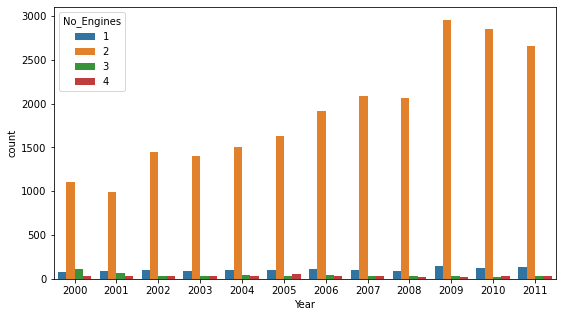

In [293]:
plt.figure(figsize=(9,5))
sns.countplot(x='Year', hue="No_Engines", data=df)

In [283]:
df

,ID,Type,Airport_Name,Altitude_Bin,Make/Model,No_Widelife_Strck,Impact to flight,FlightDate,Indicated Damage,No_Engines,Airline/Operator,State,Flight Phase,Precipitation,Remains of wildlife collected?,Remains sent to Smithsonian,Widelife Size,Sky_Condition,Species,Pilot Warned?,Cost of Damage,Feet above ground,No_People Injured,Is Aircraft Large,Year,Month
0,202152,Airplane,LAGUARDIA NY,> 1000 ft,B-737-400,859,Engine Shut Down,2000-11-23,Caused damage,2,US AIRWAYS*,New York,Climb,None,False,False,Medium,No Cloud,Unknown bird - medium,N,30736,1500.0,0,Yes,2000,11
1,208159,Airplane,DALLAS/FORT WORTH INTL ARPT,< 1000 ft,MD-80,424,None,2001-07-25,Caused damage,2,AMERICAN AIRLINES,Texas,Landing Roll,None,False,False,Small,Some Cloud,Rock pigeon,Y,0,0.0,0,No,2001,7
2,207601,Airplane,LAKEFRONT AIRPORT,< 1000 ft,C-500,261,None,2001-09-14,No damage,2,BUSINESS,Louisiana,Approach,None,False,False,Small,No Cloud,European starling,N,0,50.0,0,No,2001,9
3,215953,Airplane,SEATTLE-TACOMA INTL,< 1000 ft,B-737-400,806,Precautionary Landing,2002-09-05,No damage,2,ALASKA AIRLINES,Washington,Climb,None,True,False,Small,Some Cloud,European starling,Y,0,50.0,0,Yes,2002,9
4,219878,Airplane,NORFOLK INTL,< 1000 ft,CL-RJ100/200,942,None,2003-06-23,No damage,2,COMAIR AIRLINES,Virginia,Approach,None,False,False,Small,No Cloud,European starling,N,0,50.0,0,No,2003,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25552,319672,Airplane,SACRAMENTO INTL,< 1000 ft,B-737-700,1,None,2011-12-29,No damage,2,SOUTHWEST AIRLINES,California,Approach,None,True,True,Medium,No Cloud,Mallard,Y,0,10.0,0,Yes,2011,12
25553,321151,Airplane,REDDING MUNICIPAL,> 1000 ft,EMB-120,1,None,2011-12-30,No damage,2,SKYWEST AIRLINES,California,Approach,Fog,False,False,Large,Overcast,Unknown bird - large,N,0,1500.0,0,No,2011,12
25554,319677,Airplane,ORLANDO INTL,< 1000 ft,A-321,1,None,2011-12-30,No damage,2,US AIRWAYS,Florida,Landing Roll,None,False,False,Small,Some Cloud,Tree swallow,Y,0,0.0,0,No,2011,12
25556,319679,Airplane,DETROIT METRO WAYNE COUNTY ARPT,< 1000 ft,B-757-200,1,None,2011-12-31,No damage,2,DELTA AIR LINES,Michigan,Landing Roll,None,False,False,Medium,Some Cloud,Unknown bird - medium,Y,0,0.0,0,Yes,2011,12


In [275]:
df.to_csv('birdstrikes.csv',index = False)